In [2]:
using QuadGK,LaTeXStrings,LinearAlgebra,BenchmarkTools;
using Plots,CSV,DataFrames;
import NLsolve,Roots;
import Optim;

In [3]:
gr(frame=:box, minorticks=5, size=(400,300));
# pyplot(frame=:box, minorticks=5, size=(400,300),bg_color_legend = RGBA(1,1,1,0.15));

In [ ]:
pyplot(frame=:box, minorticks=5, size=(400,300), fontfamily="serif",titlefontsize=11
    ,guidefontsize=12,tickfontsize=11,legendfontsize=9,
    bg_color_legend = RGBA(1,1,1,0.15), markerstrokecolor= :auto);

In [4]:
include("./libs/constants.jl");
include("./libs/pwa.jl");
include("./libs/potentials.jl");

In [5]:
λf(x, y, z) = x^2 + y^2 + z^2 - 2 * x * y - 2 * x * z - 2 * y * z
q0f(E, m1, m2, m3, m4) = abs(m3^2 - m4^2 - m1^2 + m2^2) / (2 * E)
μf(m1, m2) = m1 * m2 / (m1 + m2)

# redefine sqrt so that its cut is along the positive x axis
function xsqrt(x)
    imag(x) >=0 ? sqrt(x+0im) : -sqrt(x-0im)
end
xsqrt1(x)= (imag(x)<0&&real(x)>0) ? -xsqrt(x) : xsqrt(x)

xsqrt1 (generic function with 1 method)

In [6]:
#https://github.com/fkguo/IMinuit.jl/blob/master/src/Data.jl
# check whether the data are valid for a fit
function check_data(xdata, ydata, errdata)
    if any(ismissing, xdata) || any(ismissing, ydata) || any(ismissing, errdata)
        error("Error: Data contain `missing` values.")
    end
    if any(isinf, xdata) || any(isinf, ydata) || any(isnan, xdata) || any(isnan, ydata) || any(isnan, errdata)
        error("Error: Data contain `Inf` or `NaN` values.")
    end
    if any(iszero, errdata)
        error("Error: Data contain 0 in the errors.")
    end
end

"""
    Data(x::T, y::T, err::T) where {T<:Vector{Real}}
    Data(df::DataFrame)
Fields: `x, y, err, ndata`
This defines a type for data with three columns:` x, y, err`; `ndata` is the number of data rows.
Different `Data` sets can be concatenated as `vcat(dat1, dat2, dat3)`.
Only symmetric errors (of `y`) are supported.
"""
struct Data
    x::Vector{Float64}
    y::Vector{Float64}
    err::Vector{Float64}
    ndata::Int
    function Data(x, y, err) # Data(x::Vector{T}, y::Vector{T}, err::Vector{T}) where {T<:Real}
        check_data(x, y, err)
        ndata = length(x)
        new(x, y, err, ndata)
    end
end

Data(df::DataFrame) = Data(df[:,1], df[:,2], df[:,3])

import Base.vcat, Base.getindex
vcat(dat1::Data, dat2::Data) = Data(vcat(dat1.x, dat2.x), vcat(dat1.y, dat2.y), vcat(dat1.err, dat2.err))
vcat(dat1::Data, dat...) = reduce(vcat, [dat1, dat...])
getindex(data::Data, in) = Data(map(x-> getindex(x, in), (data.x, data.y, data.err))...)

"""
    @plt_data(data, kws...)
    @plt_data!(data, kws...)
Convenient mascros to make an errorbar plot of the `data`; all combinations of
keyword settings for `scatter` in `Plots` can be used for the optional arguments `kws...`
"""
macro plt_data(data, kws...)
    _plt = quote
        if isempty($kws)
            Plots.scatter($data.x, $data.y, yerror = $data.err,
            xlab = "x", ylab = "y", label = "Data")
        else
            Plots.scatter($data.x, $data.y, yerror = $data.err; $(kws...) )
        end
    end
    return esc(_plt)
end
macro plt_data!(data, kws...)
    _plt = quote
        if isempty($kws)
            Plots.scatter!($data.x, $data.y, yerror = $data.err,
            xlab = "x", ylab = "y", label = "Data")
        else
            Plots.scatter!($data.x, $data.y, yerror = $data.err; $(kws...) )
        end
    end
    return esc(_plt)
end

@doc raw"""
    chisq(dist::Function, data, par; fitrange = ())
defines the ``\chi^2`` function: `fun` the function to be fitted to the data given by `data`.
The parameters are collected into `par`, given as an array or a tuple.
* `data` can be either given as the `Data` type, or of the form `(xdata, ydata [, err])`.
If no `err` is given explicitly, the errors are assumed to be 1 for all data points.
* `fitrange`: default to the whole data set; may given as, e.g., `2:10`,
which means only fitting to the 2nd to the 10th data points.
"""
function chisq(dist::Function, data::Data, par; fitrange = ())
    fitrange = (isempty(fitrange) ? (1:data.ndata) : fitrange)
    # __dist__(x, par) = (length(func_argnames(dist)) > 2 ? dist(x, par...) : dist(x, par) )
    res = 0.0
    @simd for i = fitrange[1]:fitrange[end]
        @inbounds res += ( (data.y[i]- dist(data.x[i], par))/data.err[i] )^2
    end
    return res
end
# function chisq(dist::Function, data::Data, par::Tuple; fitrange = ())
#     fitrange = (isempty(fitrange) && 1:data.ndata)
#     res = 0.0
#     @simd for i = fitrange
#         @inbounds res += ( (data.y[i]- dist(data.x[i], par))/data.err[i] )^2
#     end
#     return res
# end
function chisq(dist::Function, data, par; fitrange = ())
    _x = data[1]; _y = data[2]
    _n = length(_x)
    _err = (length(data) == 2 ? ones(_n) : data[3])
    fitrange = (isempty(fitrange) ? (1:data.ndata) : fitrange)
    # __dist__(x, par) = (length(func_argnames(dist)) > 2 ? dist(x, par...) : dist(x, par) )
    res = 0.0
    @simd for i = fitrange[1]:fitrange[end]
        @inbounds res += ( (_y[i]- dist(_x[i], par))/_err[i] )^2
    end
    return res
end

"""
    @plt_best(dist, fit, data, kws...)
    @plt_best!(dist, fit, data, kws...)
A convenient macro for comparing the best-fit result with the data; all combinations of
keyword settings for `plot` in `Plots` can be used for the optional arguments `kws...`
The ordering of `dist`, `fit`, and `data` does not matter.
"""
macro plt_best(dist, fit, data, kws...)
    _expr = quote
        _arr = [$dist, $fit, $data]
        _fit = _arr[findfirst(x->typeof(x) <:AbstractFit, _arr)]
        _dist = _arr[findfirst(x->typeof(x) <:Function, _arr)]
        _data = _arr[findfirst(x->typeof(x) <:Data, _arr)]

        _npts = 100
        _paras = args(_fit)
        _dis(x) = (typeof(_fit) == ArrayFit ? _dist(x, _paras) : _dist(x, _paras...) )
        _xrange = _data.x
        _wv = LinRange(_xrange[1], _xrange[end], _npts)

        Plots.scatter($data.x, $data.y, yerror = $data.err, label = "Data")
        if isempty($kws)
            Plots.plot!(_wv, _dis.(_wv), xlab = "x", ylab = "y", label = "Best fit", lw = 1.5 )
        else
            Plots.plot!(_wv, _dis.(_wv); $(kws...)  )
        end
    end
    esc( _expr )
end

macro plt_best!(dist, fit, data, kws...)
    _expr = quote
        _arr = [$dist, $fit, $data]
        _fit = _arr[findfirst(x->typeof(x) <:AbstractFit, _arr)]
        _dist = _arr[findfirst(x->typeof(x) <:Function, _arr)]
        _data = _arr[findfirst(x->typeof(x) <:Data, _arr)]

        _npts = 100
        _paras = args(_fit)
        _dis(x) = (typeof(_fit) == ArrayFit ? _dist(x, _paras) : _dist(x, _paras...) )
        _xrange = _data.x
        _wv = LinRange(_xrange[1], _xrange[end], _npts)

        Plots.scatter!($data.x, $data.y, yerror = $data.err, label = "Data")
        if isempty($kws)
            Plots.plot!(_wv, _dis.(_wv), xlab = "x", ylab = "y", label = "Best fit", lw = 1.5 )
        else
            Plots.plot!(_wv, _dis.(_wv); $(kws...)  )
        end
    end
    esc( _expr )
end

function quadgauss(f, x::T, w::T) where {T<:Vector{Float64}}
    res = zero(f(x[1]))  # zero of the same type as f(x[1]), to avoid type instability
    for i in eachindex(x)
        res += f(x[i]) * w[i]
    end
    return res
end

quadgauss (generic function with 1 method)

In [7]:
function Γf(E,q,m1,m2,m3,m12)
    E1=E+m12-sqrt(m12^2+q^2+0im)-sqrt(m3^2+q^2+0im)
    μ=(m1*m2)/(m1+m2)
    return (imag(E1)<0&&real(E1)>(m1+m2)) ? -xsqrt(2*μ*(E1-m1-m2)+0im) : xsqrt(2*μ*(E1-m1-m2)+0im)
end

function Γf3(E,q,m1,m2,m3,m12)
    E1=E+m12-sqrt(m12^2+q^2+0im)-sqrt(m3^2+q^2+0im)
    μ=(m1*m2)/(m1+m2)
    return (imag(E1)<0&&real(E1)>(m1+m2)) ? -xsqrt(2*μ*(E1-m1-m2)+0im)^3 : xsqrt(2*μ*(E1-m1-m2)+0im)^3
end

function dΓf3(E,q,m1,m2,m3,m12)
    E1=E+m12-sqrt(m12^2+q^2+0im)-sqrt(m3^2+q^2+0im)
    μ=(m1*m2)/(m1+m2)
    tmp=-3*μ*xsqrt(2*μ*(E1-m1-m2)+0im)*(q/sqrt(m12^2+q^2+0im)+q/sqrt(m3^2+q^2+0im))
    return (imag(E1)<0&&real(E1)>(m1+m2)) ? -tmp : tmp
end

ΓDscf(E, p) = (ΓRDsc + g^2 * mDn / (6 * π * fπ^2 * mDsc) * Γf3(E, p, mDn, mπc, mDn,mDsc)
                                   + g^2 * mDc / (12 * π * fπ^2 * mDsc) * Γf3(E, p, mDc, mπn, mDn,mDsc))

ΓDsnf(E, p) = (ΓRDsn + g^2 * mDn / (12 * π * fπ^2 * mDsn) * Γf3(E, p, mDn, mπn, mDc,mDsn)
                                   + g^2 * mDc / (6 * π * fπ^2 * mDsn) * (Γf3(E, p, mDc, mπc, mDc,mDsn) - Γf3(mDc + mDsn, 0, mDc, mπc, mDc,mDsn)))

dΓDscf(E, p) = (g^2 * mDn / (6 * π * fπ^2 * mDsc) * dΓf3(E, p, mDn, mπc, mDn,mDsc)
                                   + g^2 * mDc / (12 * π * fπ^2 * mDsc) * dΓf3(E, p, mDc, mπn, mDn,mDsc))

dΓDsnf(E, p) = (g^2 * mDn / (12 * π * fπ^2 * mDsn) * dΓf3(E, p, mDn, mπn, mDc,mDsn)+ g^2 * mDc / (6 * π * fπ^2 * mDsn) * dΓf3(E, p, mDc, mπc, mDc,mDsn))

function find_singular(E, den; pstart = [0.01, 0.01])
    function f!(F, x)
        pr, pi = x
        tmp = den(E, pr + im * pi)
        F[1] = real(tmp)
        F[2] = imag(tmp)
    end
    sol = NLsolve.nlsolve((F, x) -> f!(F, x), pstart)
    return sol.zero[1] + im * sol.zero[2]
end
qon_c(E)=find_singular(E, (E, p) -> E-mDn-mDsc - p^2 / (2 * μf(mDn, mDsc)) + im * ΓDscf(E, p) / 2; pstart = [reim(xsqrt1(E-mDn-mDsc + im * ΓDsc / 2))...])

qon_0(E)=find_singular(E, (E, p) -> E-mDc-mDsn - p^2 / (2 * μf(mDc, mDsn)) + im * ΓDsnf(E, p) / 2; pstart = [reim(xsqrt1(E-mDc-mDsn + im * ΓDsn / 2))...])

qon_0 (generic function with 1 method)

In [8]:
xxx,www=gauss(96,0,1);

qi=zeros(ComplexF64,2+2*length(xxx));
wi=zeros(ComplexF64,length(xxx));
len=length(xxx);
sublen=length(qi);

In [9]:
Γsmc(t,Λ,ω,V0)=t+im*V0*(1-exp(-t/ω))*(1-exp((t-Λ)/ω))
dΓsmc(t,Λ,ω,V0)=1+im*V0/ω*(exp(-t/ω)-exp((t-Λ)/ω))

dΓsmc (generic function with 1 method)

In [10]:
Γsmcx(x,Λ,ω,V0)=Γsmc(Λ*x,Λ,ω,V0) #0~x~1
dΓsmcx(x,Λ,ω,V0)=Λ*dΓsmc(Λ*x,Λ,ω,V0)

dΓsmcx (generic function with 1 method)

# parameterization
~~keep t above 0.5 on real axis(very bad)~~

correlation of $\frac{1-e^{-\Lambda_1/\omega_1}}{\omega_1}=\frac{1-e^{-\Lambda_2/\omega_2}}{\omega_2}$

~~correlation of $\frac{1-e^{-\Lambda_1/\omega_1}}{\omega_1}=\frac{1-e^{-\Lambda_2/\omega_2}}{\omega_2}$ with $V_0=-0.1$ fixed~~

~~correlation of $(1-e^{-t_0/\omega_1})(1-e^{(t_0-\Lambda_1)/\omega_1})=(1-e^{-t_0/\omega_2})(1-e^{(t_0-\Lambda_2)/\omega_2})$ with $V_0=-0.1,t_0=0.5/2$ fixed~~

In [11]:
import Interpolations;

In [12]:
Λ_correlation=collect(0.3:0.01:2.5);

In [13]:
ω_correlation=zeros(Float64,length(Λ_correlation));

In [14]:
for i in 1:length(Λ_correlation)
    Λ1,ω1=0.5,0.1
    Λ2=Λ_correlation[i]
    tmp=Roots.find_zero(x->(1-exp(-Λ2/x))/x-(1-exp(-Λ1/ω1))/ω1,(eps(),10))
    ω_correlation[i]=tmp[1]
end

In [15]:
ωΛ_corefunc=Interpolations.linear_interpolation(Λ_correlation,ω_correlation,extrapolation_bc=Interpolations.Line());

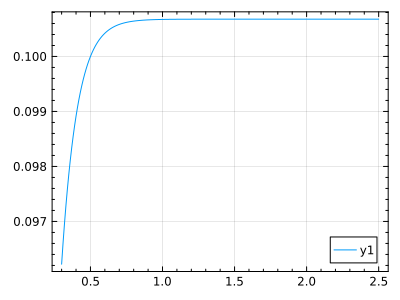

In [15]:
plot(Λ_correlation,x->ωΛ_corefunc(x))

# VGT

In [16]:
function getqw(E,Λ;V0=-0.1,qi=qi,wi=wi) # static
    Λ1,Λ2=1.5,2.22
    ω1,ω2=0.1,0.114
    ω=Λ<1.5 ? 0.1 : (ω1+(ω2-ω1)/(Λ2-Λ1)*(Λ-Λ1))
    pmax=sqrt(abs(λf(E^2,mDn^2,(mπc+mDn)^2)))/(2*E)
    qi[1],qi[2]=qon_c(E),qon_0(E)
    for i in eachindex(xxx)
        qi[2+i]=pmax*xxx[i]
        qi[2+len+i]=Γsmcx(xxx[i],Λ,ω,V0)
        wi[i]=dΓsmcx(xxx[i],Λ,ω,V0)*www[i]
    end
    nothing
end
# function getqw(E,Λ;ω=0.1,V0=-0.1,qi=qi,wi=wi) # static
#     pmax=sqrt(abs(λf(E^2,mDn^2,(mπc+mDn)^2)))/(2*E)
#     qi[1],qi[2]=qon_c(E),qon_0(E)
#     for i in eachindex(xxx)
#         qi[2+i]=pmax*xxx[i]
#         qi[2+len+i]=Γsmcx(xxx[i],Λ,ω,V0)
#         wi[i]=dΓsmcx(xxx[i],Λ,ω,V0)*www[i]
#     end
#     nothing
# end
# function getqw(E,Λ;V0=-0.1,qi=qi,wi=wi) #dynamical
#     ω=ωΛ_corefunc(Λ)
#     pmax=sqrt(abs(λf(E^2,mDn^2,(mπc+mDn)^2)))/(2*E)
#     qi[1],qi[2]=qon_c(E),qon_0(E)
#     for i in eachindex(xxx)
#         qi[2+i]=pmax*xxx[i]
#         qi[2+len+i]=Γsmcx(xxx[i],Λ,ω,V0)
#         wi[i]=dΓsmcx(xxx[i],Λ,ω,V0)*www[i]
#     end
#     nothing
# end

getqw (generic function with 1 method)

In [17]:
getqw(mDn+mDsc-360e-6-im*24e-6,0.5)

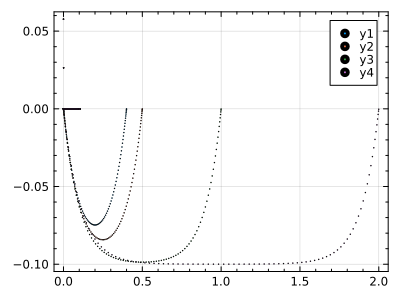

In [18]:
plot()
getqw(mDn+mDsc-360e-6-im*24e-6,0.4);
scatter!(real.(qi[1:end]),imag.(qi[1:end]),markersize=0.5)
getqw(mDn+mDsc-360e-6-im*24e-6,0.5);
scatter!(real.(qi[1:end]),imag.(qi[1:end]),markersize=0.5)
getqw(mDn+mDsc-360e-6-im*24e-6,1.0);
scatter!(real.(qi[1:end]),imag.(qi[1:end]),markersize=0.5)
getqw(mDn+mDsc-360e-6-im*24e-6,2.0);
scatter!(real.(qi[1:end]),imag.(qi[1:end]),markersize=0.5)

In [17]:
Vmat=zeros(ComplexF64,2*length(qi),2*length(qi));
Gmat=zeros(ComplexF64,2*length(qi),2*length(qi));
Tmat=zeros(ComplexF64,2*length(qi),2*length(qi));

In [18]:
function VMat!(E;Λ=0.5,Cv = 0.0,Cp=0.0,I=0,plist=qi,des=Vmat)
    getqw(E,Λ)

    for l in eachindex(plist)
        for m in eachindex(plist)
            i, j = 1, 1
            des[sublen*(i-1)+l, sublen*(j-1)+m] = potential_DnDsc(E,plist[l], plist[m]; Cv=Cv,Cp=Cp,I=I)
            i, j = 1, 2
            des[sublen*(i-1)+l, sublen*(j-1)+m] = potential_DDscross(E,plist[l], plist[m];  Cv=Cv,Cp=Cp,I=I)
            i, j = 2, 1
            des[sublen*(i-1)+l, sublen*(j-1)+m] = potential_DDscross(E,plist[l], plist[m];  Cv=Cv,Cp=Cp,I=I)
            i, j = 2, 2
            des[sublen*(i-1)+l, sublen*(j-1)+m] = potential_DcDsn(E,plist[l], plist[m];  Cv=Cv,Cp=Cp,I=I)
        end
    end
    return nothing
end

VMat! (generic function with 1 method)

In [19]:
Gc(E,q)=1/(2π^2)/(E-mDn-mDsc-q^2/(2*μf(mDn,mDsc))+im*ΓDscf(E,q)/2)
Gn(E,q)=1/(2π^2)/(E-mDc-mDsn-q^2/(2*μf(mDc,mDsn))+im*ΓDsnf(E,q)/2)

Gn (generic function with 1 method)

In [20]:
function GMat!(E;Λ=0.5,qi=qi,wi=wi,des=Gmat)
    getqw(E,Λ)
    
    i=1
    for j in eachindex(wi)
        des[(i-1)*sublen+2+len+j,(i-1)*sublen+2+len+j]=wi[j]*qi[2+len+j]^2*Gc(E,qi[2+len+j])
    end
    
    i=2
    for j in eachindex(wi)
        des[(i-1)*sublen+2+len+j,(i-1)*sublen+2+len+j]=wi[j]*qi[2+len+j]^2*Gn(E,qi[2+len+j])
    end
    
    return nothing
end

GMat! (generic function with 1 method)

In [21]:
function detVG(E;Λ=0.5,Cv=0.0,Cp=0.0,I=0)
    VMat!(E;Λ=Λ,Cv=Cv,Cp=Cp,I=I)
    GMat!(E;Λ=Λ)
    return det(LinearAlgebra.I-Vmat*Gmat)
end

detVG (generic function with 1 method)

In [22]:
function TMat!(E;Λ=0.5,Cv=0.0,Cp=0.0,I=0,des=Tmat)
    VMat!(E;Λ=Λ,Cv=Cv,Cp=Cp,I=I)
    GMat!(E;Λ=Λ)
    # try 
    #     des .=inv(LinearAlgebra.I-Vmat*Gmat)*Vmat
    # catch
    #     error("Λ:$Λ; Cv:$Cv")
    # end
    des .=inv(LinearAlgebra.I-Vmat*Gmat)*Vmat
    nothing
end

TMat! (generic function with 1 method)

# Extract pole position

In [25]:
function find_poles(pars)
    _lam,_Cv,_Cp=pars
    function f!(F, x)
        e, γ = x
        tmp = detVG(e + im * γ; Λ = _lam,Cv=_Cv,Cp=_Cp)
        F[1] = real(tmp)
        F[2] = imag(tmp)
    end
    tmp=NLsolve.nlsolve((F, x) -> f!(F, x), [mDn + mDsc - 333e-6, -24e-6])
    return tmp.residual_norm <1e-8 ? (tmp.zero[1]-mDn-mDsc)+im*tmp.zero[2] : NaN+im*NaN
end

find_poles (generic function with 1 method)

In [26]:
find_poles([0.39614186936602863,0.0,0.0])

-0.0003504251703407846 - 2.4598529261869314e-5im

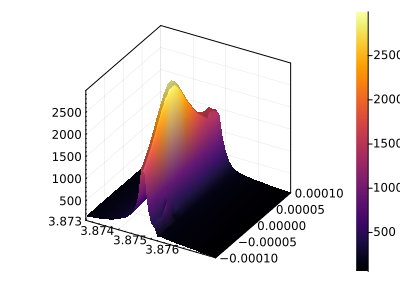

In [27]:
let Ev=collect(3.873:0.0001:3.877),Γv=collect(-100e-6:10e-6:100e-6)
    function tmpf(x)
        TMat!(x;Λ=0.39614186936602863)
        Tmat[1,1]
    end
    resv=[abs(tmpf(x+im*y)) for y in Γv,x in Ev]
    surface(Ev,Γv,resv)
end

# Fitting

In [23]:
using Interpolations;

In [24]:
function maketmatrixf(E)
    tmatrix=zeros(ComplexF64,len)
    tmp=zero(ComplexF64)
    for k in 3:(2+len)
        tmp=1.0
        for i in eachindex(wi)
            tmp+=wi[i]*qi[2+len+i]^2*Gc(E,qi[2+len+i])*Tmat[k,2+len+i]
            tmp+=-wi[i]*qi[2+len+i]^2*Gn(E,qi[2+len+i])*Tmat[k,sublen+2+len+i]
        end
        tmatrix[k-2]=tmp
    end
    return LinearInterpolation(real.(qi[3:2+len]),tmatrix)
end

maketmatrixf (generic function with 1 method)

In [37]:
# let Ev=collect(3.873:0.0001:3.877),qv=real.(qi[3:2+len])
#     interp_E=[maketmatrixf(E) for E in Ev]
#     res_mat=stack([interp_E[i].(qv) for i in eachindex(Ev)])
#     plt1=surface(Ev,qv,real.(res_mat),legend=false)
#     plt2=surface(Ev,qv,imag.(res_mat),legend=false)
#     plt3=surface(Ev,qv,abs.(res_mat),legend=false)
#     plot(plt1,plt2,plt3,layout=(1,3),size=(1000,300))
# end

In [25]:
function Γ3f(E;Λ = 0.5,Cv=0.0,Cp=0.0)
    TMat!(E;Λ = Λ,Cv=Cv,Cp=Cp)

    res = 0.0
    μ1, μ2 = μf(mDn, mDsc), μf(mDc, mDsn)
    m1,m2,m3=mDn,mπc,mDn

    tmptmatrixf = maketmatrixf(E)
    tmatrixf(p) = (real(qi[3]) <= p && p <= real(qi[2+len])) ? tmptmatrixf(p) : 0.0
    for i in eachindex(xxx)
        for j in eachindex(xxx)
            x1, x2, w1, w2 = xxx[i], xxx[j], www[i], www[j]
            s23=(m2+m3)^2*(1-x1)+(E-m1)^2*x1
            s12_min=m1^2+m2^2-(s23-E^2+m1^2)*(s23+m2^2-m3^2)/(2*s23)-sqrt(abs(λf(s23,E^2,m1^2)*λf(s23,m2^2,m3^2)))/(2*s23)
            s12_max=m1^2+m2^2-(s23-E^2+m1^2)*(s23+m2^2-m3^2)/(2*s23)+sqrt(abs(λf(s23,E^2,m1^2)*λf(s23,m2^2,m3^2)))/(2*s23)
            s12=s12_min*(1-x2)+s12_max*x2
            q,qbar=sqrt(λf(s23,mπc^2,mDn^2))/(2*sqrt(s23)),sqrt(λf(s12,mDn^2,mπc^2))/(2*sqrt(s12))
            p,pbar=sqrt(λf(E^2,mDn^2,s23))/(2*E),sqrt(λf(E^2,mDn^2,s12))/(2*E)
            res+=w1*w2*abs((E-m1)^2-(m2+m3)^2)*abs(s12_max-s12_min)*abs(q*tmatrixf(p)*Gc(E,p)+qbar*tmatrixf(pbar)*Gc(E,pbar))^2
        end
    end
    return res
end

Γ3f (generic function with 1 method)

In [31]:
function Resolution(E, E1)
    σ1 = 1.05 * 263e-6
    σ2 = 2.413 * σ1
    α = 0.778
    gaussfunc(x, μ, σ) = 1 / sqrt(2 * π) / σ * exp(-(x - μ)^2 / (2 * σ^2))
    return α * gaussfunc(E, E1, σ1) + (1 - α) * gaussfunc(E, E1, σ2)
end

Resolution (generic function with 1 method)

## fitting

In [34]:
using PyCall;
import NLsolve;
piminuit=pyimport("iminuit");

In [35]:
let 
    data_ddπ_sub_df = DataFrame(CSV.File("./data/ddpi_sub_du.csv", header = ["x", "y"]));
    len=length(data_ddπ_sub_df.x)
    len1=Int64(len/3)
    xv=[3.8731+0.0002*(i-1) for i in 1:20]
    yv=[data_ddπ_sub_df.y[3*(i-1)+2] for i in 1:len1]
    wv=[abs(data_ddπ_sub_df.y[3*(i-1)+1]-data_ddπ_sub_df.y[3*(i-1)+3])/2 for i in 1:len1]
    global const data_ddπ_sub=Data(xv,yv,wv);
    nothing
end

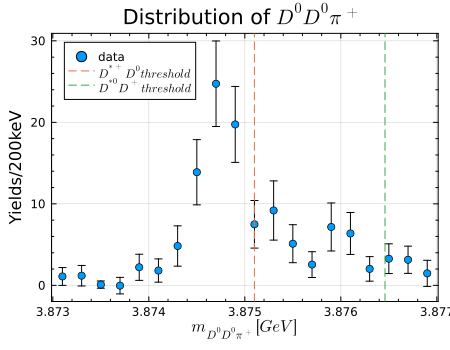

In [36]:
@plt_data data_ddπ_sub title = L"Distribution of $D^0D^0\pi^+$" xlabel = L"m_{D^0D^0\pi^+}[GeV]" ylabel = "Yields/200keV" label = "data" size = (450, 350)
vline!([mDn + mDsc], ls = :dash, label = L"D^{*+}D^0 threshold")
vline!([mDc + mDsn], ls = :dash, label = L"D^{*0}D^+ threshold")

In [37]:
mutable struct distr
    Λ::Float64
    Cv::Float64
    Cp::Float64
    Γ3::Vector{Float64}
end

In [38]:
let Λ = 0.3919058474670764,Cv=0.0,Cp=0.0,Ev = range(3.873, 3.877, 100)
    resv = [Γ3f(e; Λ = Λ,Cv=Cv,Cp=Cp) for e in Ev]
    global distr_inst = distr(Λ,Cv,Cp, resv)
end

distr(0.3919058474670764, 0.0, 0.0, [0.003402726091315534, 0.0036978748129866384, 0.0040218369927339966, 0.004377530907803512, 0.00476925155098338, 0.005200842394746929, 0.00567787216517481, 0.0062061182026787514, 0.00679137280479066, 0.007441557832886541  …  0.6203749058682453, 0.6218677942424718, 0.6658379661743141, 0.5881466879449244, 0.5670971307924186, 0.6316860402829343, 0.5790083498189409, 0.5249585491144482, 0.5800249077950922, 0.5900880500356364])

In [39]:
function remake_distr(dis::distr, Λ,Cv,Cp)
    if Λ ≈ dis.Λ&&Cv≈dis.Cv&&Cp≈dis.Cp
        return false
    else
        Ev = range(3.873, 3.877, 100)
        for i in eachindex(dis.Γ3)
            dis.Γ3[i] = Γ3f(Ev[i];Λ = Λ,Cv=Cv,Cp=Cp)
        end
        dis.Λ = Λ
        dis.Cv=Cv 
        dis.Cp=Cp
    end
    return true
end

remake_distr (generic function with 1 method)

In [40]:
function dist(E, pars; dis = distr_inst, xx = xxx, ww = www)
    N, Λ,Cv,Cp = pars
    remake_distr(dis, Λ,Cv,Cp)
    Ev = range(3.873, 3.877, 100)
    Emin, Emax = Ev[1], Ev[end]
    tmpΓ3f = LinearInterpolation(Ev, dis.Γ3)
    
    tmpf(E) = quadgauss(x ->(Emax - Emin) * tmpΓ3f(Emin + (Emax - Emin) * x) * Resolution(Emin + (Emax - Emin) * x, E), xx, ww)

    ΔE=0.0002
    Ebin(E,x)=(E-ΔE/2)*(1-x)+(E+ΔE/2)*x
    return N * quadgauss(x->ΔE*tmpf(Ebin(E,x)),xx,ww)
end

dist (generic function with 1 method)

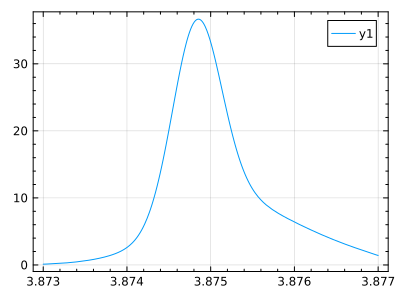

In [41]:
plot(e->dist(e,[1,0.3919058474670764,0.0,0.0])*30/0.0015,3.873,3.877)

In [42]:
fcn(x,y,z,l; fitrange = ()) = chisq(dist, data_ddπ_sub,[x,y,z,l]; fitrange = fitrange)

fcn (generic function with 1 method)

## fitting results

In [43]:
let 
    _n,_lam,_Cv,_Cp=[10000,0.3919058474670764,0.0,0.0]
    tmp_model=piminuit.Minuit(fcn,N=_n,lam=_lam,cv=_Cv,cp=_Cp,name=("N","lam","cv","cp"))
    set!(tmp_model.limits,"N",(5000,12000))
    set!(tmp_model.limits,"lam",(0.3,0.5))
    set!(tmp_model.fixed,"cv",true)
    set!(tmp_model.fixed,"cp",true)
    global fitres=piminuit.Minuit.migrad(tmp_model) 
end

PyObject <FMin algorithm='Migrad' edm=9.738034916936801e-06 edm_goal=0.0002 errordef=1.0 fval=14.690700048479828 has_accurate_covar=True has_covariance=True has_made_posdef_covar=False has_parameters_at_limit=False has_posdef_covar=True has_reached_call_limit=False has_valid_parameters=True hesse_failed=False is_above_max_edm=False is_valid=True nfcn=59 ngrad=0 reduced_chi2=nan time=265.4001270000008>
(Param(number=0, name='N', value=10144.361528692374, error=1088.8164539455693, merror=None, is_const=False, is_fixed=False, lower_limit=5000.0, upper_limit=12000.0), Param(number=1, name='lam', value=0.39614186936602863, error=0.0009692805501871349, merror=None, is_const=False, is_fixed=False, lower_limit=0.3, upper_limit=0.5), Param(number=2, name='cv', value=0.0, error=0.1, merror=None, is_const=False, is_fixed=True, lower_limit=None, upper_limit=None), Param(number=3, name='cp', value=0.0, error=0.1, merror=None, is_const=False, is_fixed=True, lower_limit=None, upper_limit=None))
[[1.23813302e+06 2.67816819e-01 0.00000000e+00 0.00000000e+00]
 [2.67816819e-01 9.39534253e-07 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]

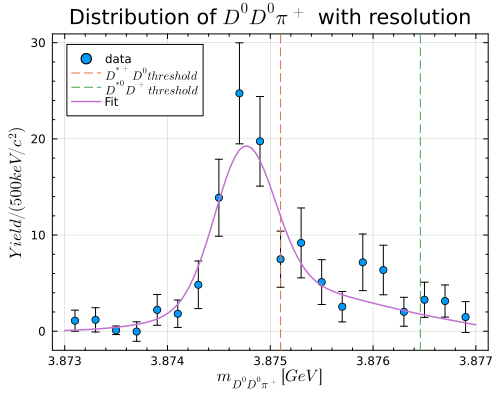

In [44]:
let
    Ev = range(3.873, 3.877, 100)
    @plt_data data_ddπ_sub title = L"Distribution of $D^0D^0\pi^+$ with resolution" xlabel = L"m_{D^0D^0\pi^+}[GeV]" ylabel = L"Yield/(500keV/c^2)" label = "data" size = (500, 400) legend = :topleft
    vline!([mDn + mDsc], ls = :dash, label = L"D^{*+}D^0 threshold")
    vline!([mDc + mDsn], ls = :dash, label = L"D^{*0}D^+ threshold")
    plot!(Ev, e -> dist(e, [fitres.values[1],fitres.values[2],0.0,0.0]), lw = 1.5, label = "Fit")
end

In [45]:
fitres.values

PyObject <ValueView N=10144.361528692374 lam=0.39614186936602863 cv=0.0 cp=0.0>

In [42]:
find_poles([fitres.values[2],0.0,0.0])

-0.0003504251614412368 - 2.459852937025976e-5im

# Test Cv (from constrained parameters in SchemeII)

In [62]:
df_pre_paras=DataFrame(CSV.File("./output/review_lamv_Cv_scheme3.csv"));

In [63]:
pre_Nv=df_pre_paras.N
pre_Cv=df_pre_paras.Cv;
pre_Λv=df_pre_paras.lam;

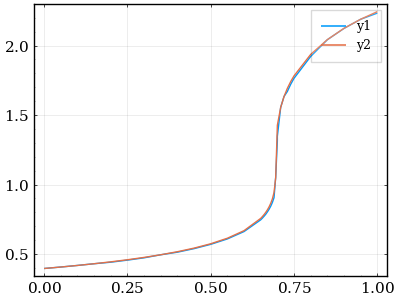

In [68]:
plot(pre_Cv,pre_Λv,markersize=2.0)
plot!(pre_Cv,Λv_Cv,markersize=2.0)

## poles from constrained parameters

In [46]:
poles_tmp=zeros(ComplexF64,35);

In [47]:
for i in 1:35
    poles_tmp[i]=find_poles([pre_Λv[i],pre_Cv[i],0.0])
    println(poles_tmp[i])
end

-0.0003505163408314971 - 2.4597419066820387e-5im
-0.00035020515970662913 - 2.419394455791743e-5im
-0.00035252758891068936 - 2.379650187071432e-5im
-0.00034978136861596454 - 2.343810929367911e-5im
-0.0003076370277796947 - 2.3883063542274867e-5im
-0.000307177340415965 - 2.3505358425841964e-5im
-0.00030681357360462513 - 2.315148938208757e-5im
-0.00034922308300489036 - 2.2509810698485266e-5im
-0.0003066103343409843 - 2.294998457399132e-5im
-0.0003074482977720727 - 2.357643856235922e-5im
-0.0003079243904497986 - 2.397882800814364e-5im
-0.0003070143686705329 - 2.365301266910597e-5im
-0.00030629817780081225 - 2.2383564336389647e-5im
-0.0003064813771032071 - 2.276273498872362e-5im
-0.0003063458898906468 - 2.269773564958582e-5im
-0.00030663467854319393 - 2.2971356910450766e-5im
-0.0003057066725911106 - 2.264978047316173e-5im
-0.00030663969816568937 - 2.2961741310551897e-5im
-0.00030646993380667453 - 2.2738755653677653e-5im
-0.00030617847407832244 - 2.2413075606160208e-5im
-0.0003058779996130134

In [48]:
let i=5
    println(find_poles([pre_Λv[i]+0.0025,pre_Cv[i],0.0]))
end

-0.00034811668612633184 - 2.3177217395983172e-5im


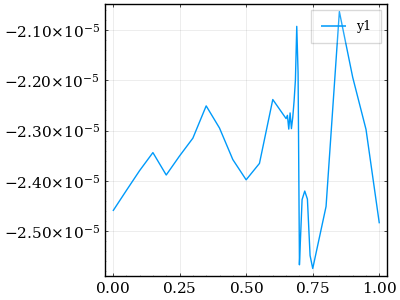

In [45]:
plot(pre_Cv,imag.(poles_tmp))

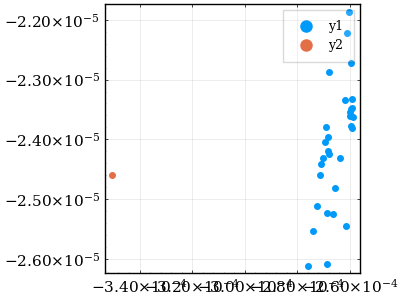

sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


In [55]:
let 
    poles_v=[find_poles([pre_Λv[i],pre_Cv[i],0.0]) for i in 1:30]
    scatter(real.(poles_v),imag.(poles_v))
    scatter!([-350.4*1.0e-6],[-24.6*1.0e-6])
end

## constrained by poles

In [65]:
Λv_Cv=copy(pre_Λv);

In [51]:
# let 
#     function tmpf(x;Cv=0.0)
#         res=find_poles([x[1],Cv,0.0])
# #         isnan(res) ? 1 : abs(res-(-0.000350 - 24.6e-6im))
#         isnan(res) ? 1 : abs(real(res)-(-0.000350))
#     end
    
#     for i in 1:35
#         println(i)
#         tmpcv=pre_Cv[i]
#         tmpΛ=pre_Λv[i]
#         res=Optim.optimize(x->tmpf(x;Cv=tmpcv),[0.95*tmpΛ],[1.05*tmpΛ],[tmpΛ])
#         global Λv_Cv[i]=Optim.minimizer(res)[1]
#     end
# end

In [67]:
for i in 14:35
    println(i)
    Λv_Cv[i]=Roots.find_zero(x->real(find_poles([x,pre_Cv[i],0.0]))+350.4e-6,(0.9*pre_Λv[i],1.1*pre_Λv[i]))
end

14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35


In [69]:
fitres_V3=Array{Any}(undef,35);

In [70]:
for i in 1:35
    println(i)
    _n,_lam,_Cv,_Cp=[10000,Λv_Cv[i],pre_Cv[i],0.0]
    tmp_model=piminuit.Minuit(fcn,N=_n,lam=_lam,cv=_Cv,cp=_Cp,name=("N","lam","cv","cp"))
    set!(tmp_model.fixed,"lam",true)
    set!(tmp_model.fixed,"cv",true)
    set!(tmp_model.fixed,"cp",true)
    fitres_V3[i]=piminuit.Minuit.migrad(tmp_model) 
end

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35


In [71]:
[fitres_V3[i].fval for i in 1:35]

35-element Vector{Float64}:
 14.690710025173338
 14.78497658600794
 14.857011023215161
 14.924453130578579
 14.968979171472018
 15.034276138694322
 15.054455480075667
 15.060085037249914
 15.078465515846146
 14.995507186537479
 14.89374593388523
 15.100550333410675
 15.184457961057314
  ⋮
 14.734900871048401
 14.734900871048401
 14.752750283843234
 14.732550493991704
 14.704354580243134
 14.671394316530595
 14.448828224787835
 14.790363676969559
 15.191999361865324
 14.922859808489667
 14.734400806329187
 14.595697665562527

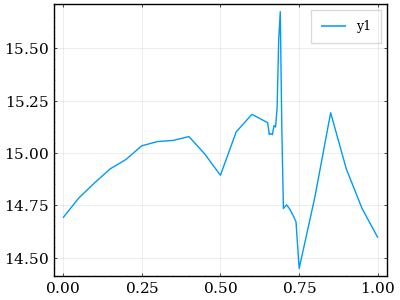

In [72]:
plot(pre_Cv,[fitres_V3[i].fval for i in 1:35],markersize=2.0)

In [73]:
CSV.write("./output/review_lamv_Cv_scheme3.csv",DataFrame(N=[fitres_V3[i].values[1] for i in 1:35]
        ,lam=[fitres_V3[i].values[2] for i in 1:35],Cv=[fitres_V3[i].values[3] for i in 1:35]
        ,chisq=[fitres_V3[i].fval for i in 1:35]))

"./output/review_lamv_Cv_scheme3.csv"

## constrained by fitting

In [52]:
fitres_V3=Array{Any}(undef,35);

In [59]:
for i in [7]
    println(i)
    _n,_lam,_Cv,_Cp=[10000,0.4758717022834428,pre_Cv[i],0.0]
    tmp_model=piminuit.Minuit(fcn,N=_n,lam=_lam,cv=_Cv,cp=_Cp,name=("N","lam","cv","cp"))
#     set!(tmp_model.limits,"lam",(0.98*_lam,1.02*_lam))
    set!(tmp_model.fixed,"lam",true)
    set!(tmp_model.fixed,"cv",true)
    set!(tmp_model.fixed,"cp",true)
    fitres_V3[i]=piminuit.Minuit.migrad(tmp_model) 
end

7


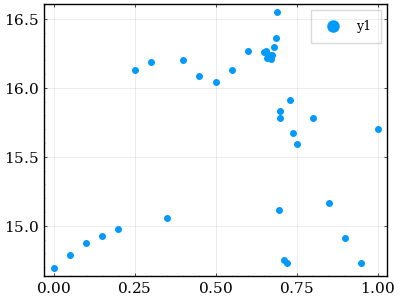

sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


In [129]:
scatter([fitres_V3[i].values[3] for i in 1:35],[fitres_V3[i].fval for i in 1:35])

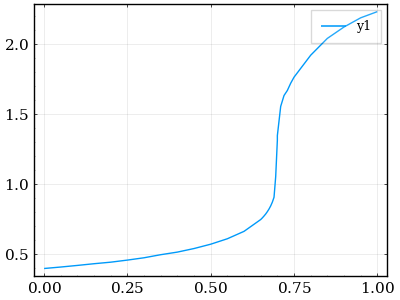

In [132]:
plot([fitres_V3[i].values[3] for i in 1:35],[fitres_V3[i].values[2] for i in 1:35])

In [60]:
fitres_V3[7]

PyObject <FMin algorithm='Migrad' edm=2.8406230326942694e-18 edm_goal=0.0002 errordef=1.0 fval=15.051782738397534 has_accurate_covar=True has_covariance=True has_made_posdef_covar=False has_parameters_at_limit=False has_posdef_covar=True has_reached_call_limit=False has_valid_parameters=True hesse_failed=False is_above_max_edm=False is_valid=True nfcn=13 ngrad=0 reduced_chi2=nan time=10.743186749983579>
(Param(number=0, name='N', value=6890.997693827999, error=733.6846717873744, merror=None, is_const=False, is_fixed=False, lower_limit=None, upper_limit=None), Param(number=1, name='lam', value=0.4758717022834428, error=0.004758717022834428, merror=None, is_const=False, is_fixed=True, lower_limit=None, upper_limit=None), Param(number=2, name='cv', value=0.30000000000000004, error=0.0030000000000000005, merror=None, is_const=False, is_fixed=True, lower_limit=None, upper_limit=None), Param(number=3, name='cp', value=0.0, error=0.1, merror=None, is_const=False, is_fixed=True, lower_limit=None, upper_limit=None))
[[538293.19761575      0.              0.              0.        ]
 [     0.              0.              0.              0.        ]
 [     0.              0.              0.              0.        ]
 [     0.              0.              0.              0.        ]]

In [ ]:
# show(stdout, "text/plain",[fitres_V3[i].fval for i in 1:30])
# show(stdout, "text/plain",[fitres_V3[i].valid for i in 1:30])
show(stdout, "text/plain", [fitres_V3[i].values[2] for i in 1:30])

In [134]:
CSV.write("./output/review_lamv_Cv_scheme3.csv",DataFrame(N=[fitres_V3[i].values[1] for i in 1:35]
        ,lam=[fitres_V3[i].values[2] for i in 1:35],Cv=[fitres_V3[i].values[3] for i in 1:35]
        ,chisq=[fitres_V3[i].fval for i in 1:35]))

"./output/review_lamv_Cv_scheme3.csv"

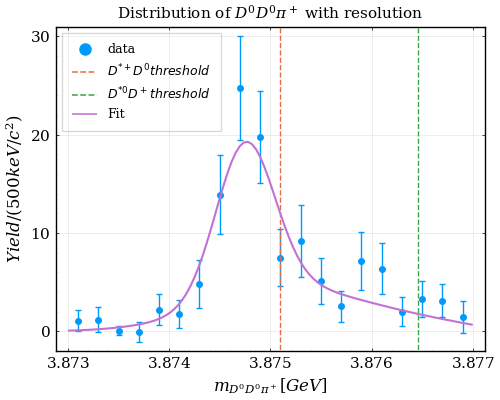

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.6056031611752245, 0.9786801175696073, 1.0)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.6056031611752245, 0.9786801175696073, 1.0)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.6056031611752245, 0.9786801175696073, 1.0)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: No data for colormapping provided via 'c'

In [105]:
let nf=1
    Ev = range(3.873, 3.877, 100)
    @plt_data data_ddπ_sub title = L"Distribution of $D^0D^0\pi^+$ with resolution" xlabel = L"m_{D^0D^0\pi^+}[GeV]" ylabel = L"Yield/(500keV/c^2)" label = "data" size = (500, 400) legend = :topleft
    vline!([mDn + mDsc], ls = :dash, label = L"D^{*+}D^0 threshold")
    vline!([mDc + mDsn], ls = :dash, label = L"D^{*0}D^+ threshold")
    plot!(Ev, e -> dist(e, [fitres_V3[nf].values[1],fitres_V3[nf].values[2],fitres_V3[nf].values[3],0.0]), lw = 1.5, label = "Fit")
end

In [133]:
for i in 1:35
    println(find_poles([fitres_V3[i].values[2],fitres_V3[i].values[3],0.0]))
end

-0.0003505163408314971 - 2.4597419066820387e-5im
-0.00035020515970662913 - 2.419394455791743e-5im
-0.00035252758891068936 - 2.379650187071432e-5im
-0.00034978136861596454 - 2.343810929367911e-5im
-0.0003076370277796947 - 2.3883063542274867e-5im
-0.000307177340415965 - 2.3505358425841964e-5im
-0.00030681357360462513 - 2.315148938208757e-5im
-0.00034922308300489036 - 2.2509810698485266e-5im
-0.0003066103343409843 - 2.294998457399132e-5im
-0.0003074482977720727 - 2.357643856235922e-5im
-0.0003079243904497986 - 2.397882800814364e-5im
-0.0003070143686705329 - 2.365301266910597e-5im
-0.00030629817780081225 - 2.2383564336389647e-5im
-0.0003064813771032071 - 2.276273498872362e-5im
-0.0003063458898906468 - 2.269773564958582e-5im
-0.00030663467854319393 - 2.2971356910450766e-5im
-0.0003057066725911106 - 2.264978047316173e-5im
-0.00030663969816568937 - 2.2961741310551897e-5im
-0.00030646993380667453 - 2.2738755653677653e-5im
-0.00030617847407832244 - 2.2413075606160208e-5im
-0.0003058779996130134

In [126]:
let
    i=5
    println(find_poles([fitres_V3[i].values[2]+0.0025,fitres_V3[i].values[3],0.0]))
end

-0.0003480962830524348 - 2.3177424630566642e-5im


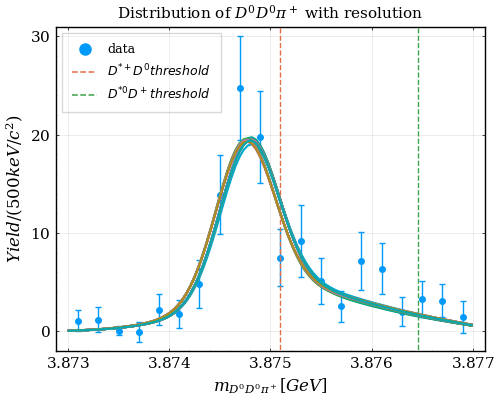

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.6056031611752245, 0.9786801175696073, 1.0)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.6056031611752245, 0.9786801175696073, 1.0)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.6056031611752245, 0.9786801175696073, 1.0)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: No data for colormapping provided via 'c'

In [108]:
let 
    Ev = range(3.873, 3.877, 100)
    @plt_data data_ddπ_sub title = L"Distribution of $D^0D^0\pi^+$ with resolution" xlabel = L"m_{D^0D^0\pi^+}[GeV]" ylabel = L"Yield/(500keV/c^2)" label = "data" size = (500, 400) legend = :topleft
    vline!([mDn + mDsc], ls = :dash, label = L"D^{*+}D^0 threshold")
    vline!([mDc + mDsn], ls = :dash, label = L"D^{*0}D^+ threshold")
    for nf in 1:1:35
        plot!(Ev, e -> dist(e, [fitres_V3[nf].values[1],fitres_V3[nf].values[2],fitres_V3[nf].values[3],0.0]), lw = 1.5, label = false)
    end
    current()
end

# Explore distribution with respect to $\mathcal{M}(s,t;E)$

In [26]:
Gram(x,y,z,u,v,w)=(x^2*y+x*y^2+z^2*u+z*u^2+v*w^2+v^2*w+x*z*w+x*u*v+y*z*v+y*u*w-x*y*(z+u+v+w)-z*u*(x+y+v+w)-v*w*(x+y+z+u))

Gram (generic function with 1 method)

In [27]:
function amplitude_Est(E,s12,s23;Λ = 0.3919058474670764,Cv=0.0,Cp=0.0)
    TMat!(E;Λ = Λ,Cv=Cv,Cp=Cp)

    μ1, μ2 = μf(mDn, mDsc), μf(mDc, mDsn)
    m1,m2,m3=mDn,mπc,mDn

    tmptmatrixf = maketmatrixf(E)
    tmatrixf(p) = (real(qi[3]) <= p && p <= real(qi[2+len])) ? tmptmatrixf(p) : 0.0
    q,qbar=sqrt(λf(s23,mπc^2,mDn^2))/(2*sqrt(s23)),sqrt(λf(s12,mDn^2,mπc^2))/(2*sqrt(s12))
    p,pbar=sqrt(λf(E^2,mDn^2,s23))/(2*E),sqrt(λf(E^2,mDn^2,s12))/(2*E)

    return q*tmatrixf(p)*Gc(E,p)+qbar*tmatrixf(pbar)*Gc(E,pbar)
end

amplitude_Est (generic function with 1 method)

In [28]:
amplitude_Est(3.875,(mDn+mπc+0.001)^2,(mDn+mπc+0.001)^2)

11.986638491741335 - 2.7375046339760356im

In [33]:
function plotMC_E(E; Λ = 0.3919058474670764, Cv = 0.0, Cp = 0.0)
    TMat!(E; Λ = Λ, Cv = Cv, Cp = Cp)
    m1, m2, m3 = mDn, mπc, mDn
    tmptmatrixf = maketmatrixf(E)
    tmatrixf(p) = (real(qi[3]) <= p && p <= real(qi[2 + len])) ? tmptmatrixf(p) : 0.0

    function ampsq(s12, s23)
        q = sqrt(λf(s23, m2^2, m3^2)) / (2 * sqrt(s23))
        qbar = sqrt(λf(s12, m1^2, m2^2)) / (2 * sqrt(s12))
        p = sqrt(λf(E^2, m1^2, s23)) / (2 * E)
        pbar = sqrt(λf(E^2, m3^2, s12)) / (2 * E)
        return abs(q * tmatrixf(p) * Gc(E, p) + qbar * tmatrixf(pbar) * Gc(E, pbar))^2
    end

    s13_v = range((m1 + m3)^2, (E - m2)^2; length = 210)
    s23_v = range((m2 + m3)^2, (E - m1)^2; length = 200)

    # For heatmap(x, y, z), z must have size (length(y), length(x)).
    res_mat = fill(NaN, length(s23_v), length(s13_v))
    for j in eachindex(s23_v)
        s23 = s23_v[j]
        for i in eachindex(s13_v)
            s13 = s13_v[i]
            s12 = E^2 + m1^2 + m2^2 + m3^2 - s13 - s23
            if Gram(s23, s12, m3^2, m1^2, E^2, m2^2) <= 0.0
                res_mat[j, i] = ampsq(s12, s23)
            end
        end
    end

    validvals = res_mat[isfinite.(res_mat)]
    zmax = isempty(validvals) ? 1.0 : maximum(validvals)

    return heatmap(
        s13_v,
        s23_v,
        res_mat;
        color = :rainbow_bgyr_35_85_c72_n256,
        # legend = false,
        # xlabel = L"s_{13}",
        # ylabel = L"s_{23}",
        # title = "Dalitz plot",
        # clims = (0.0, zmax)
    )
end

plotMC_E (generic function with 1 method)

In [30]:
mDn+mDsc-0.0003504251703407846

3.8747495748296594

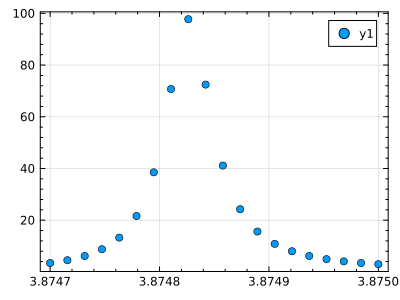

In [31]:
scatter(collect(range(3.8747, 3.875, 20)),E->Γ3f(E;Λ = 0.3919058474670764,Cv=0.0,Cp=0.0))

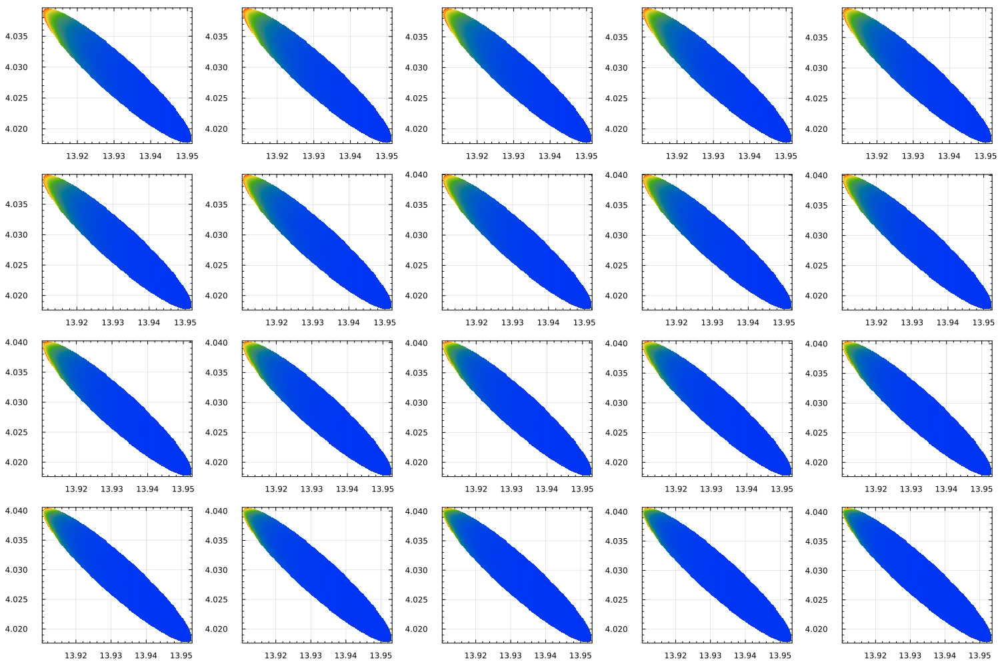

In [32]:
let Ev = range(3.8747, 3.875, 20)
    plts=Array{Any}(undef,20)
    for i in 1:20
        plts[i]=plotMC_E(Ev[i];Λ = 0.3919058474670764,Cv=0.0,Cp=0.0)
    end
    plot(plts...,layout=(4,5),size=(1500,1000))
end

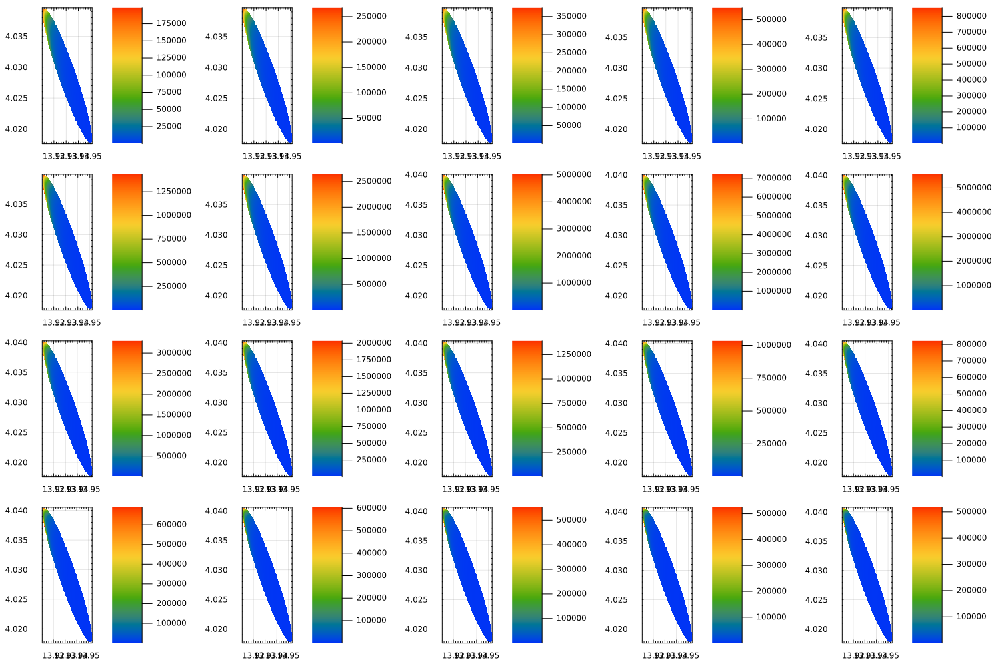

In [34]:
let Ev = range(3.8747, 3.875, 20)
    plts=Array{Any}(undef,20)
    for i in 1:20
        plts[i]=plotMC_E(Ev[i];Λ = 0.3919058474670764,Cv=0.0,Cp=0.0)
    end
    plot(plts...,layout=(4,5),size=(1500,1000))
end

In [36]:
function amp_inv(s,t;E)
    s12,s23,s13=E^2+2*mDn^2+mπc^2-s-t, s, t
    amplitude_Est(E,s12,s23;Λ = 0.3919058474670764,Cv=0.0,Cp=0.0)
end

amp_inv (generic function with 1 method)

In [39]:
function plot_ImAmp_E(E; Λ = 0.3919058474670764, Cv = 0.0, Cp = 0.0)
    TMat!(E; Λ = Λ, Cv = Cv, Cp = Cp)
    m1, m2, m3 = mDn, mπc, mDn
    tmptmatrixf = maketmatrixf(E)
    tmatrixf(p) = (real(qi[3]) <= p && p <= real(qi[2 + len])) ? tmptmatrixf(p) : 0.0

    function Imamp(s12, s23)
        q = sqrt(λf(s23, m2^2, m3^2)) / (2 * sqrt(s23))
        qbar = sqrt(λf(s12, m1^2, m2^2)) / (2 * sqrt(s12))
        p = sqrt(λf(E^2, m1^2, s23)) / (2 * E)
        pbar = sqrt(λf(E^2, m3^2, s12)) / (2 * E)
        return imag(q * tmatrixf(p) * Gc(E, p) + qbar * tmatrixf(pbar) * Gc(E, pbar))
    end

    s13_v = range((m1 + m3)^2, (E - m2)^2; length = 210)
    s23_v = range((m2 + m3)^2, (E - m1)^2; length = 200)

    # For heatmap(x, y, z), z must have size (length(y), length(x)).
    res_mat = fill(NaN, length(s23_v), length(s13_v))
    for j in eachindex(s23_v)
        s23 = s23_v[j]
        for i in eachindex(s13_v)
            s13 = s13_v[i]
            s12 = E^2 + m1^2 + m2^2 + m3^2 - s13 - s23
            if Gram(s23, s12, m3^2, m1^2, E^2, m2^2) <= 0.0
                res_mat[j, i] = Imamp(s12, s23)
            end
        end
    end

    validvals = res_mat[isfinite.(res_mat)]
    zmax = isempty(validvals) ? 1.0 : maximum(validvals)

    return heatmap(
        s13_v,
        s23_v,
        res_mat;
        color = :rainbow_bgyr_35_85_c72_n256,
        legend = false,
        # xlabel = L"s_{13}",
        # ylabel = L"s_{23}",
        # title = "Dalitz plot",
        # clims = (0.0, zmax)
    )
end

plot_ImAmp_E (generic function with 1 method)

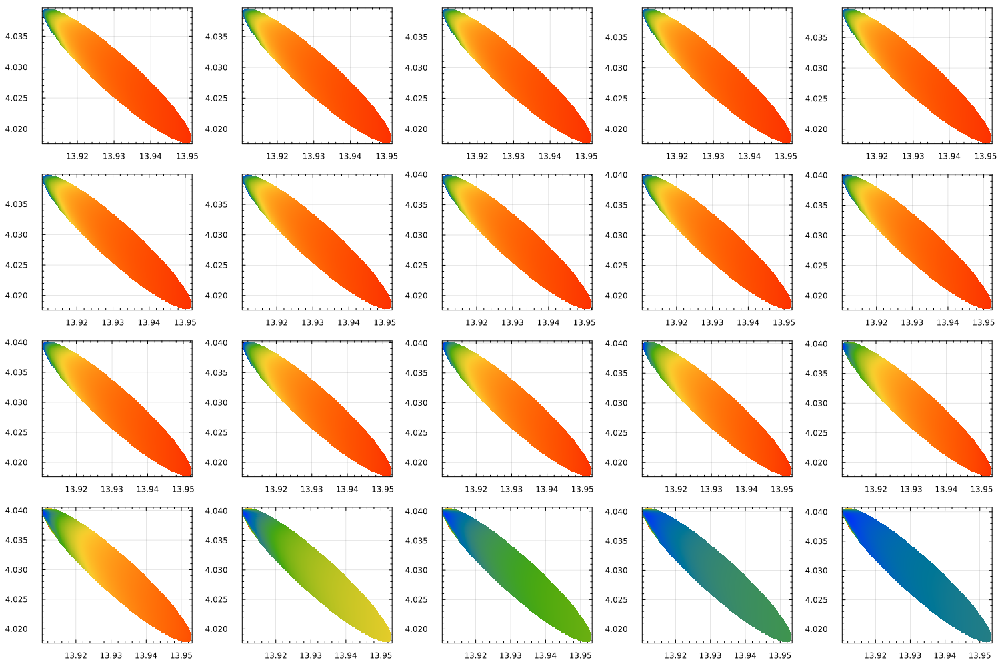

In [40]:
let Ev = range(3.8747, 3.875, 20)
    plts=Array{Any}(undef,20)
    for i in 1:20
        plts[i]=plot_ImAmp_E(Ev[i];Λ = 0.3919058474670764,Cv=0.0,Cp=0.0)
    end
    plot(plts...,layout=(4,5),size=(1500,1000))
end

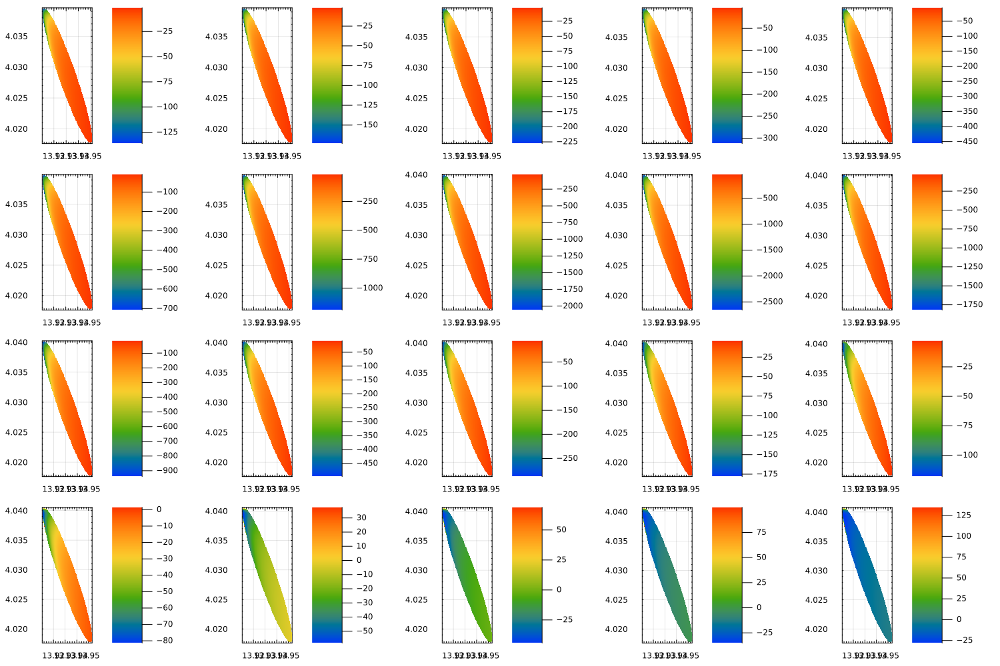

In [38]:
let Ev = range(3.8747, 3.875, 20)
    plts=Array{Any}(undef,20)
    for i in 1:20
        plts[i]=plot_ImAmp_E(Ev[i];Λ = 0.3919058474670764,Cv=0.0,Cp=0.0)
    end
    plot(plts...,layout=(4,5),size=(1500,1000))
end

In [42]:
let E=3.874

    (mDn+mπc)^2,(E-mDn)^2,(E+mDn)^2
end

(4.017661011539952, 4.036723905600001, 32.93428454559999)

In [43]:
let E=3.878

    (mDn+mπc)^2,(E-mDn)^2,(E+mDn)^2
end

(4.017661011539952, 4.0528131856, 32.980211265600005)

In [44]:
sqrt(1+im),sqrt(1-im)

(1.09868411346781 + 0.45508986056222733im, 1.09868411346781 - 0.45508986056222733im)

In [46]:
-xsqrt(1-im)

1.09868411346781 - 0.45508986056222733im